In [ ]:
import cv2
from PIL import Image
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

from dataclasses import dataclass
from random import randint
from glob import glob
import os

from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from torchvision import models, transforms

import torch
from torch import FloatTensor
from torch.optim import SGD
from torch.nn import BCEWithLogitsLoss
from torch.utils.data import Dataset, DataLoader

In [ ]:
def read_annotation(path):
    anno = pd.read_csv(path).reset_index()
    filename = anno.columns[1]

    anno.columns = ['x', 'y']

    img_filename = f'helen_1/{filename}.jpg'

    img = cv2.imread(img_filename)
    if img is None: 
        raise(FileNotFoundError) 
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    return {
        'anno': anno,
        'img': img
    }

In [ ]:
@dataclass
class Bbox:
    left: int
    right: int
    top: int
    bottom: int

    def area(self):
        if self.left > self.right:
            return 0.0
        # print(top, bottom)
        if self.top > self.bottom:
            return 0.0
        return (self.right - self.left) * (self.bottom - self.top)

    def aspect_ratio(self):
        if abs(self.bottom - self.top) == 0:
            return 1e20
        else:
            return 1.0 * abs(self.right - self.left) / abs(self.bottom - self.top)

In [ ]:
def get_bbox_from_anno(anno):
    return Bbox(
        left=int(anno['x'].min()),
        right=int(anno['x'].max()),
        top=int(anno['y'].min()),
        bottom=int(anno['y'].max())
    )

In [ ]:
def intersection(bbox_1: Bbox, bbox_2: Bbox) -> Bbox:
    return Bbox(
        left=max(bbox_1.left, bbox_2.left),
        right=min(bbox_1.right, bbox_2.right),
        top=max(bbox_1.top, bbox_2.top),
        bottom=min(bbox_1.bottom, bbox_2.bottom)
    )

In [ ]:
assert abs(intersection(
    Bbox(left=0, right=10, top=0, bottom=10),
    Bbox(top=11, bottom=20, left=10, right=10)
).area()) < 0.1

In [ ]:
def IoU(bbox_1, bbox_2):
    bbox_inter = intersection(bbox_1, bbox_2)

    return bbox_inter.area() / (bbox_1.area() + bbox_2.area() - bbox_inter.area())

In [ ]:
def NMS(candidates, threshold=0.1):
    scores_bboxes = candidates.copy()
    scores_bboxes.sort()
    result_bboxes = []

    while scores_bboxes:
        _, curr_bbox = scores_bboxes.pop()
        new_scores_bboxes = []
        for score, bbox in scores_bboxes:
            if IoU(bbox, curr_bbox) < threshold:
                new_scores_bboxes.append((score, bbox))

        scores_bboxes = new_scores_bboxes
        result_bboxes.append(curr_bbox)

    return result_bboxes

In [ ]:
def random_crop(image):
    height, width = image.shape[:2]
    
    x1 = randint(0, width)
    x2 = randint(0, width)

    left = min(x1, x2)
    right = max(x1, x2)

    y1 = randint(0, height)
    y2 = randint(0, height)

    top = min(y1, y2)
    bottom = max(y1, y2)

    return Bbox(left=left, right=right, top=top, bottom=bottom)

In [ ]:
def draw_bboxes(img, true_bbox, pred_bbox):
    plt.imshow(img)

    bbox = true_bbox
    height = bbox.bottom - bbox.top
    width = bbox.right - bbox.left
    plt.gca().add_patch(Rectangle((bbox.left, bbox.top),
                                  width,
                                  height,
                                  linewidth=3,
                                  edgecolor='green',
                                  facecolor='none',
                                  label='true')
    )

    bbox = pred_bbox
    height = bbox.bottom - bbox.top
    width = bbox.right - bbox.left
    plt.gca().add_patch(Rectangle((bbox.left, bbox.top),
                                  width,
                                  height,
                                  linewidth=3,
                                  edgecolor='orange',
                                  facecolor='none',
                                  label='pred')
    )

    plt.legend()
    plt.show()

In [ ]:
def random_bbox_shift(image, bbox: Bbox, ratio: float = 0.05):
    max_bottom, max_right = image.shape[:2]
    
    height = bbox.bottom - bbox.top
    width = bbox.right - bbox.left

    width_delta = int(width * ratio)
    height_delta = int(height * ratio)

    return Bbox(
        left=max(0, bbox.left + randint(-width_delta, width_delta)),
        right=min(max_right, bbox.right + randint(-width_delta, width_delta)),
        top=max(0, bbox.top + randint(-height_delta, height_delta)),
        bottom=min(max_bottom, bbox.bottom + randint(-height_delta, height_delta))
    )

In [ ]:
def get_zero_label_bboxes(image, bbox: Bbox, num_bboxes=10):
    bboxes = []
    while len(bboxes) < num_bboxes:
        random_bbox = random_crop(image)
        if intersection(bbox, random_bbox).area() < 0.001 and 0.33 < random_bbox.aspect_ratio() < 3:
            bboxes.append(random_bbox)

    return bboxes

In [ ]:
def get_one_label_bboxes(image, bbox: Bbox, num_bboxes=10):

    return [random_bbox_shift(image, bbox) for i in range(num_bboxes)]

In [ ]:
def crop_bbox(img, bbox: Bbox):
    
    return img[bbox.top:bbox.bottom, bbox.left:bbox.right]

In [ ]:
def read_dataset(anno_folder_path):
    images = []
    bboxes = []
    for filename in glob(os.path.join(anno_folder_path, '*.txt')):
        try:
            anno = read_annotation(filename)
        except FileNotFoundError as e:
            continue
        
        bbox = get_bbox_from_anno(anno['anno'])

        images.append(anno['img'])
        bboxes.append(bbox)
    
    return images, bboxes

In [ ]:
def transform_image(img):
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
    ])

    return transform(Image.fromarray(img))

In [ ]:
def make_classifier_data(images, bboxes, num_bboxes=10):
    clf_images = []
    clf_labels = []
    for image, bbox in zip(images, bboxes):
        true_bboxes = get_one_label_bboxes(image, bbox, num_bboxes)
        false_bboxes = get_zero_label_bboxes(image, bbox, num_bboxes)

        one_label_images = [transform_image(crop_bbox(image, bb)) for bb in true_bboxes]
        zero_label_images = [transform_image(crop_bbox(image, bb)) for bb in false_bboxes]

        clf_images += one_label_images + zero_label_images
        clf_labels += [[0, 1]] * num_bboxes + [[1, 0]] * num_bboxes

    shuffled_images, shuffled_labels = shuffle(clf_images, clf_labels, random_state=42)

    return shuffled_images, shuffled_labels

In [ ]:
! wget -q http://www.ifp.illinois.edu/~vuongle2/helen/data/helen_1.zip

In [ ]:
! unzip -qo helen_1.zip

In [ ]:
! wget -q http://www.ifp.illinois.edu/~vuongle2/helen/data/annotation.zip

In [ ]:
! unzip -qo annotation.zip

In [ ]:
images, bboxes = read_dataset('annotation')

In [ ]:
images_train, images_val, bboxes_train, bboxes_val = train_test_split(images, bboxes, test_size=0.2, random_state=42)

In [ ]:
clf_train_images, clf_train_labels = make_classifier_data(images_train, bboxes_train)
clf_val_images, clf_val_labels = make_classifier_data(images_val, bboxes_val)

In [ ]:
class Clf_Images(Dataset):
    def __init__(self, x, y):
        self.x = x
        self.y = y

    def __getitem__(self, index):
        return {
            'X': FloatTensor(self.x[index]),
            'y': FloatTensor(self.y[index])
        }

    def __len__(self):
        return len(self.y)

In [ ]:
clf_train_dataset = Clf_Images(clf_train_images, clf_train_labels)
clf_val_dataset = Clf_Images(clf_val_images, clf_val_labels)

clf_train_loader = DataLoader(
    clf_train_dataset,
    batch_size=100,
    drop_last=False,
    shuffle=True,
    num_workers=2
)
clf_val_loader = DataLoader(
    clf_val_dataset,
    batch_size=100,
    drop_last=False,
    shuffle=True,
    num_workers=2
)

In [ ]:
device = 'cuda:0'
clf_model = models.MobileNetV2(num_classes=2).to(device)

In [ ]:
criterion = BCEWithLogitsLoss()
optimizer = SGD(clf_model.parameters(), lr=0.001, momentum=0.9)

In [ ]:
%%time

for epoch in range(10):

    train_loss = 0.0
    clf_model.train()
    for index_train, item in enumerate(clf_train_loader):
        optimizer.zero_grad()

        X = item['X'].to(device)
        y = item['y'].to(device)
        
        predictions = clf_model(X)

        loss = criterion(predictions, y)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
    
    val_loss = 0.0
    clf_model.eval()
    acc = 0
    for index_val, item in enumerate(clf_val_loader):
        with torch.no_grad():
            X = item['X'].to(device)
            y = item['y'].to(device)

            predictions = clf_model(X)
            
            loss = criterion(predictions, y)

            val_loss += loss.item()

    train_loss /= index_train + 1
    val_loss /= index_val + 1
    print(f'Epoch {epoch + 1} [train, val] loss: {round(train_loss, 5)}, {round(val_loss, 5)}')

Epoch 1 [train, val] loss: 0.58323, 0.89386
Epoch 2 [train, val] loss: 0.34712, 0.44905
Epoch 3 [train, val] loss: 0.21799, 0.271
Epoch 4 [train, val] loss: 0.16468, 0.21174
Epoch 5 [train, val] loss: 0.11399, 0.11293
Epoch 6 [train, val] loss: 0.08352, 0.1565
Epoch 7 [train, val] loss: 0.0652, 0.08509
Epoch 8 [train, val] loss: 0.04699, 0.06444
Epoch 9 [train, val] loss: 0.04028, 0.05122
Epoch 10 [train, val] loss: 0.03344, 0.04831
CPU times: user 2min 51s, sys: 2min 26s, total: 5min 18s
Wall time: 5min 25s


In [ ]:
from tqdm import tqdm

0it [00:00, ?it/s]


IoU: 0.83


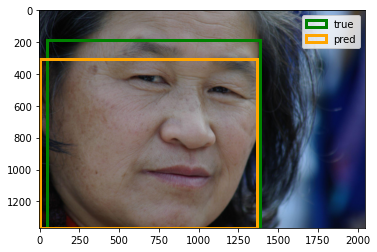

1it [00:24, 24.42s/it]


IoU: 0.43


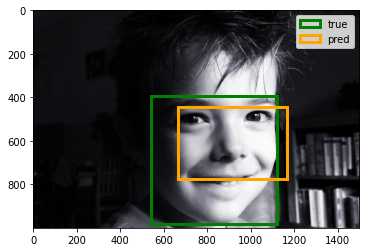

2it [00:39, 21.69s/it]


IoU: 0.5


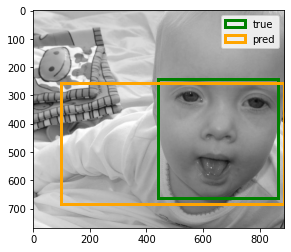

3it [00:49, 18.12s/it]


IoU: 0.49


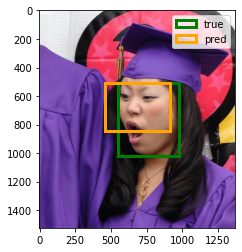

4it [01:09, 18.73s/it]


IoU: 0.34


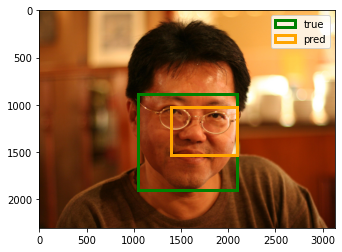

5it [02:03, 29.20s/it]


IoU: 0.84


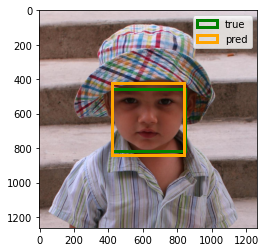

6it [02:19, 25.42s/it]


IoU: 0.75


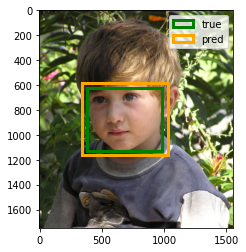

7it [02:44, 25.14s/it]


IoU: 0.75


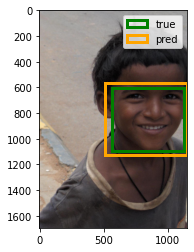

8it [03:03, 23.41s/it]


IoU: 0.58


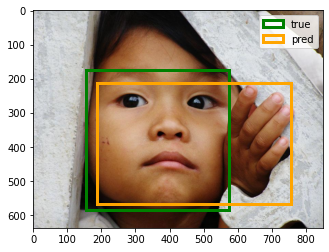

9it [03:12, 19.06s/it]


IoU: 0.65


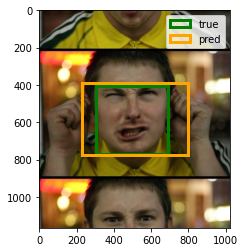

10it [03:26, 17.50s/it]


IoU: 0.72


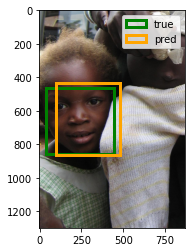

11it [03:40, 16.33s/it]


IoU: 0.77


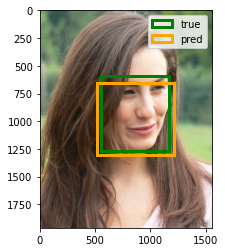

12it [04:07, 19.59s/it]


IoU: 0.84


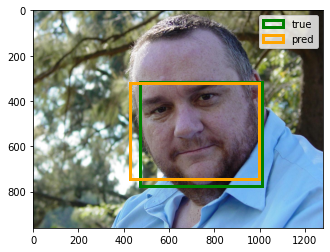

13it [04:20, 17.81s/it]


IoU: 0.58


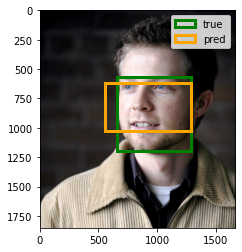

14it [04:47, 20.49s/it]


IoU: 0.89


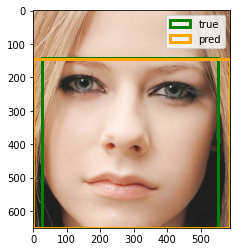

15it [04:55, 16.69s/it]


IoU: 0.72


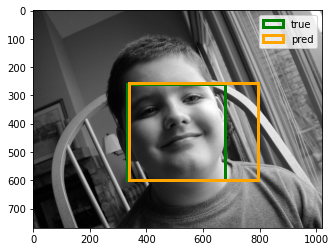

16it [05:05, 14.79s/it]


IoU: 0.55


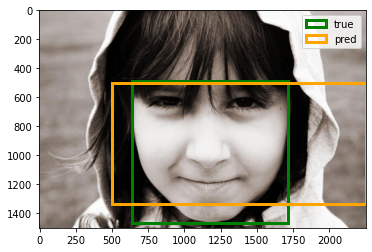

17it [05:33, 18.70s/it]


IoU: 0.43


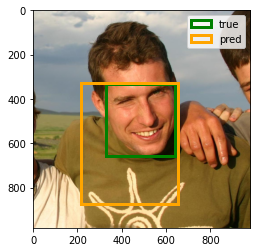

18it [05:45, 16.62s/it]


IoU: 0.6


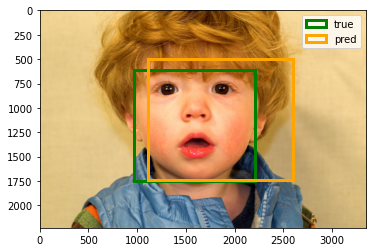

19it [06:40, 28.15s/it]


IoU: 0.61


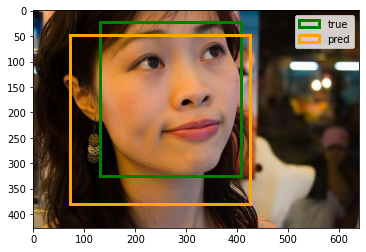

20it [06:47, 21.78s/it]


IoU: 0.34


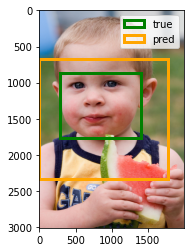

21it [07:34, 29.31s/it]


IoU: 0.68


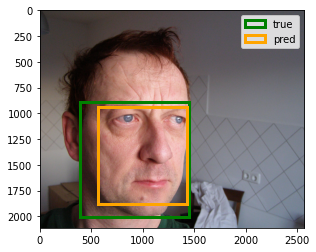

22it [08:16, 33.19s/it]


IoU: 0.54


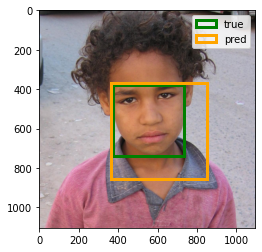

23it [08:29, 27.23s/it]


IoU: 0.72


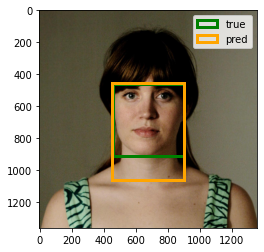

24it [08:47, 24.39s/it]


IoU: 0.41


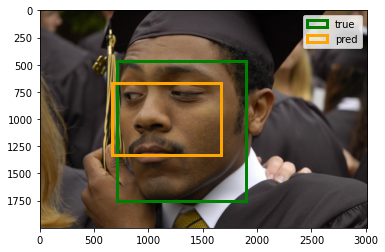

25it [09:33, 30.75s/it]


IoU: 0.66


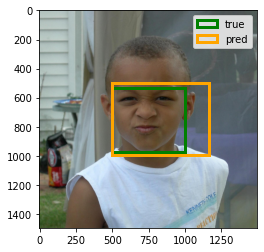

26it [09:54, 27.80s/it]


IoU: 0.62


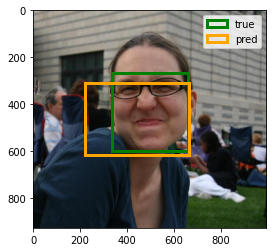

27it [10:06, 23.01s/it]


IoU: 0.6


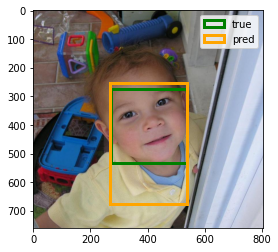

28it [10:15, 18.97s/it]


IoU: 0.53


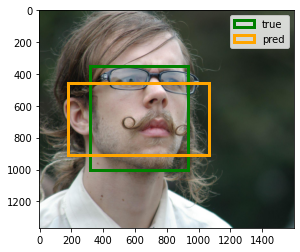

29it [10:36, 19.49s/it]


IoU: 0.62


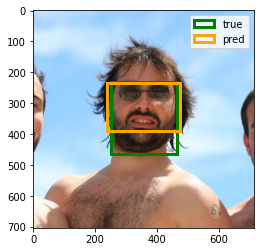

30it [10:45, 16.32s/it]


IoU: 0.43


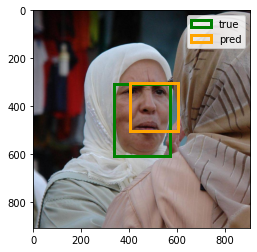

31it [10:56, 14.82s/it]


IoU: 0.57


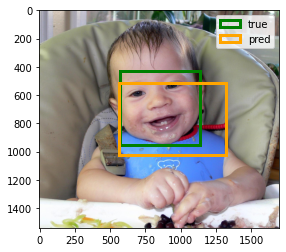

32it [11:20, 17.49s/it]


IoU: 0.38


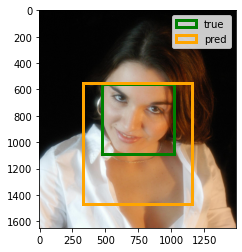

33it [11:43, 19.09s/it]


IoU: 0.58


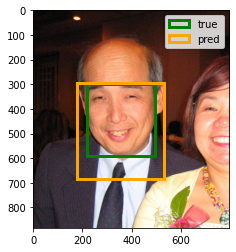

34it [11:53, 16.47s/it]


IoU: 0.61


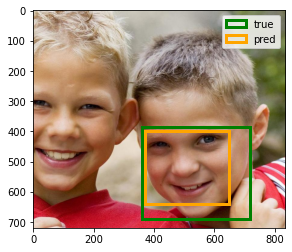

35it [12:02, 14.38s/it]


IoU: 0.78


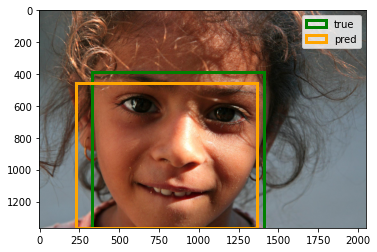

36it [12:27, 17.48s/it]


IoU: 0.5


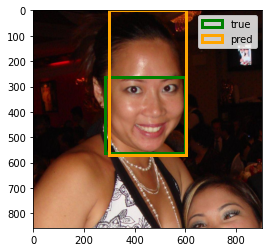

37it [12:38, 15.44s/it]


IoU: 0.62


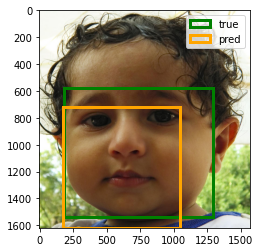

38it [13:01, 17.83s/it]


IoU: 0.94


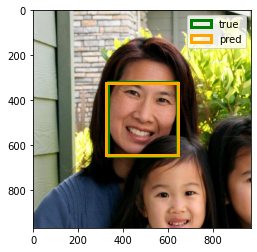

39it [13:13, 15.90s/it]


IoU: 0.75


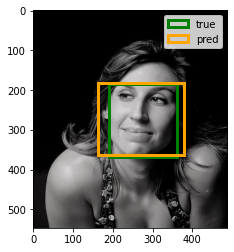

40it [13:19, 13.15s/it]


IoU: 0.5


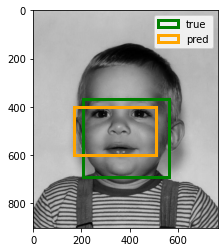

41it [13:29, 12.16s/it]


IoU: 0.48


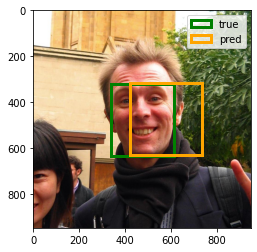

42it [13:40, 11.85s/it]


IoU: 0.96


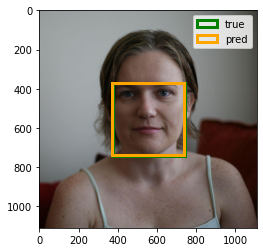

43it [13:54, 12.34s/it]


IoU: 0.11


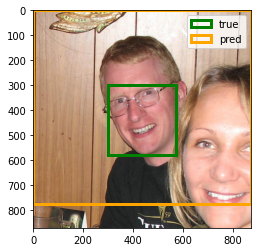

44it [14:04, 11.73s/it]


IoU: 0.62


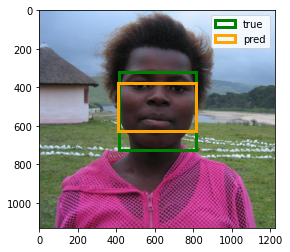

45it [14:19, 12.62s/it]


IoU: 0.33


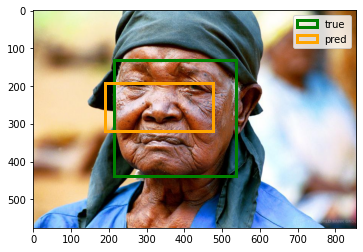

46it [14:27, 11.33s/it]


IoU: 0.35


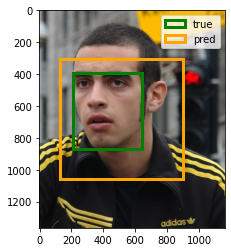

47it [14:43, 12.81s/it]


IoU: 0.66


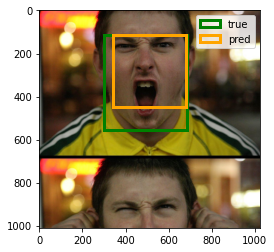

48it [14:56, 12.67s/it]


IoU: 0.79


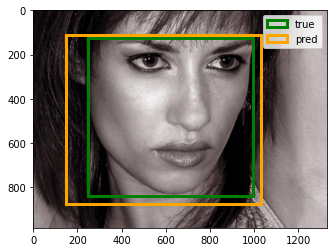

49it [15:10, 13.11s/it]


IoU: 0.37


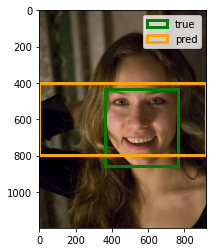

50it [15:23, 13.11s/it]


IoU: 0.46


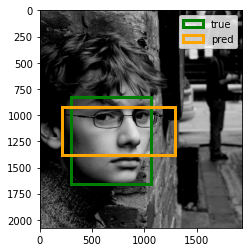

51it [15:56, 19.14s/it]


IoU: 0.57


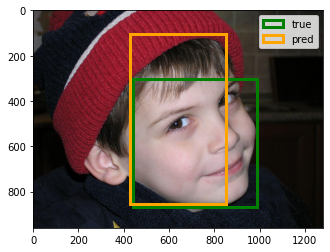

52it [16:10, 17.63s/it]


IoU: 0.5


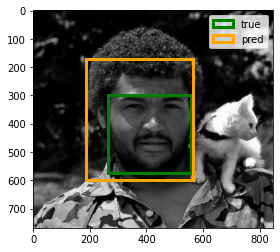

53it [16:20, 15.32s/it]


IoU: 0.88


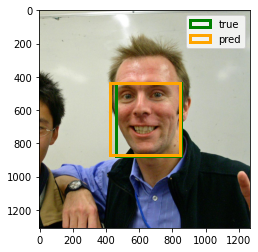

54it [16:38, 15.97s/it]


IoU: 0.82


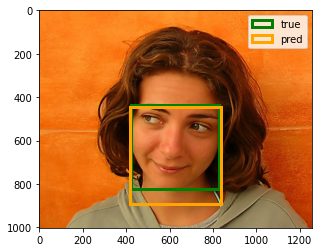

55it [16:51, 15.23s/it]


IoU: 0.32


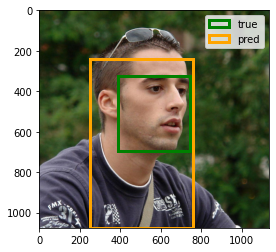

56it [17:05, 14.65s/it]


IoU: 0.45


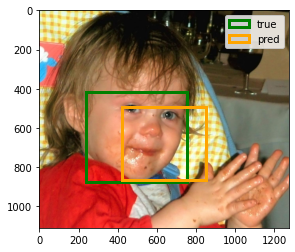

57it [17:19, 14.64s/it]


IoU: 0.21


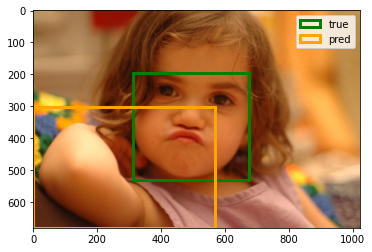

58it [17:29, 13.12s/it]


IoU: 0.55


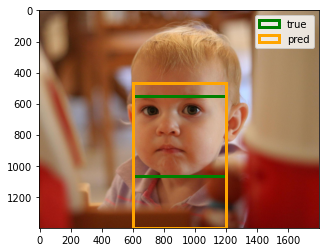

59it [17:51, 15.84s/it]


IoU: 0.5


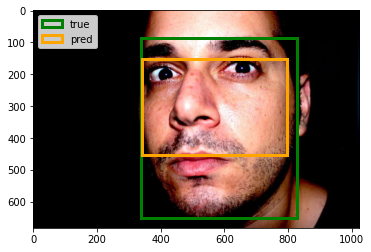

60it [18:01, 14.04s/it]


IoU: 0.8


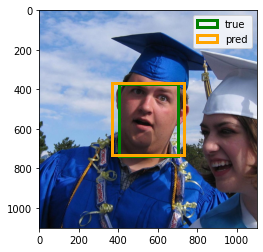

61it [18:14, 13.90s/it]


IoU: 0.69


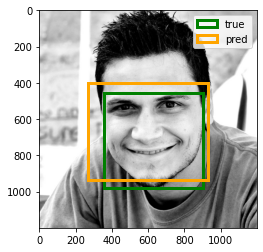

62it [18:30, 14.29s/it]


IoU: 0.65


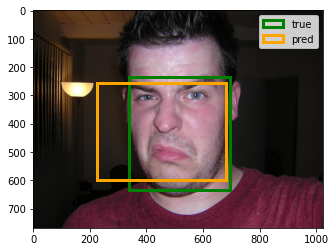

63it [18:40, 13.17s/it]


IoU: 0.37


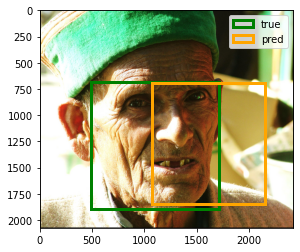

64it [19:20, 21.19s/it]


IoU: 0.5


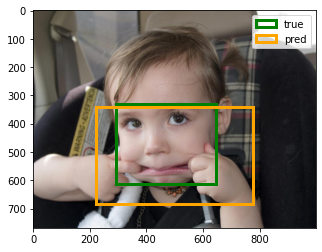

65it [19:31, 18.05s/it]


IoU: 0.59


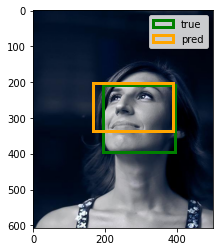

66it [19:38, 14.87s/it]


IoU: 0.44


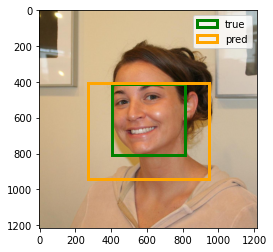

67it [19:54, 15.22s/it]


IoU: 0.58


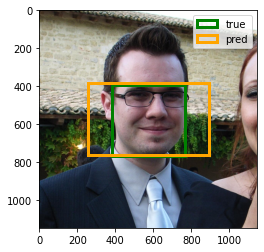

68it [20:09, 15.13s/it]


IoU: 0.0


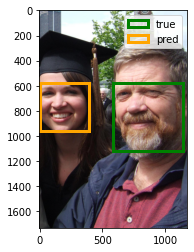

69it [20:30, 16.76s/it]


IoU: 0.74


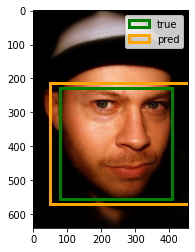

70it [20:37, 14.01s/it]


IoU: 0.38


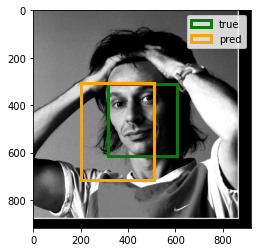

71it [20:48, 13.03s/it]


IoU: 0.74


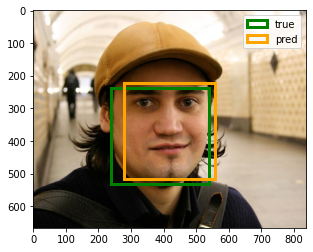

72it [20:57, 11.72s/it]


IoU: 0.0


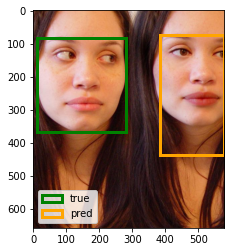

73it [21:04, 10.46s/it]


IoU: 0.54


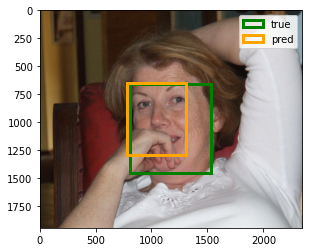

74it [21:40, 18.15s/it]


IoU: 0.43


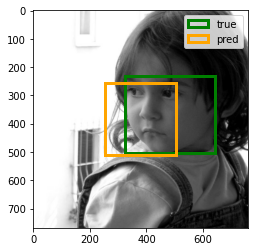

75it [21:49, 15.39s/it]


IoU: 0.71


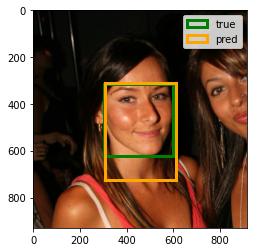

76it [22:00, 14.06s/it]


IoU: 0.62


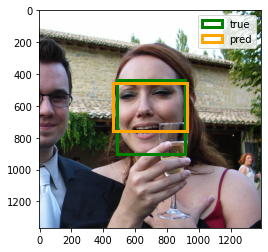

77it [22:19, 15.39s/it]


IoU: 0.33


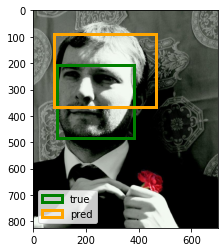

78it [22:28, 13.52s/it]


IoU: 0.63


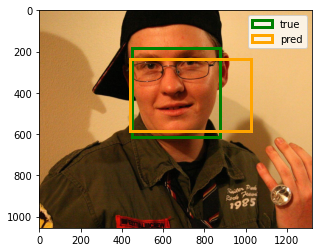

79it [22:43, 13.91s/it]


IoU: 0.71


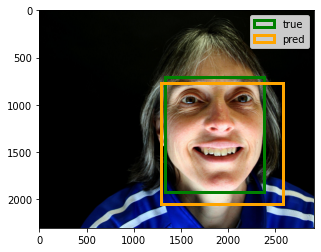

80it [23:33, 24.88s/it]


IoU: 0.8


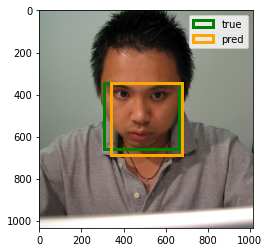

81it [23:46, 21.29s/it]


IoU: 0.67


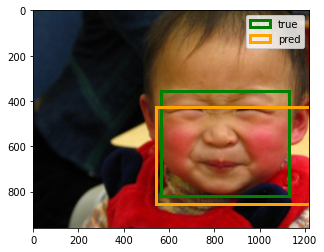

82it [24:00, 19.02s/it]


IoU: 0.53


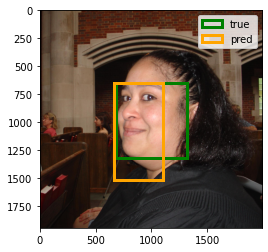

83it [24:33, 23.13s/it]


IoU: 0.67


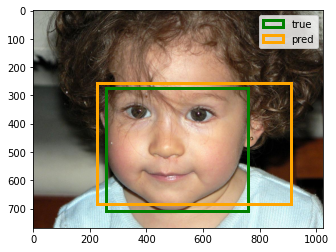

84it [24:43, 19.45s/it]


IoU: 0.83


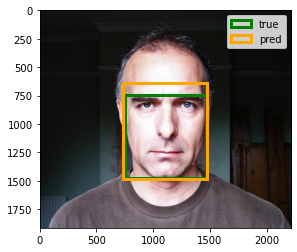

85it [25:18, 24.02s/it]


IoU: 0.59


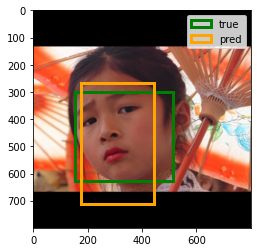

86it [25:28, 19.81s/it]


IoU: 0.74


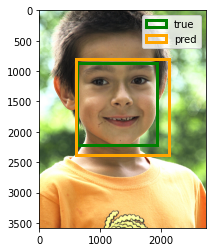

87it [26:39, 35.25s/it]


IoU: 0.45


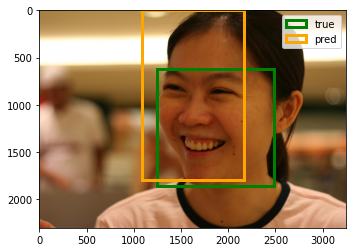

88it [27:34, 41.04s/it]


IoU: 0.85


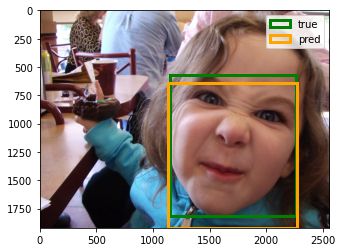

89it [28:12, 40.20s/it]


IoU: 0.78


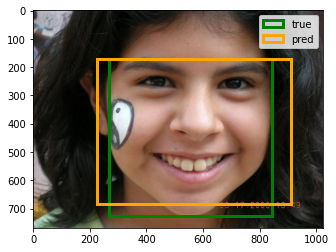

90it [28:22, 31.23s/it]


IoU: 0.74


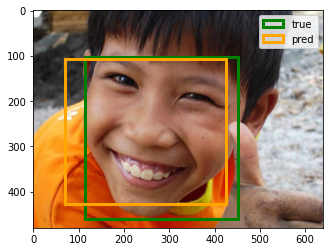

91it [28:29, 23.93s/it]


IoU: 0.71


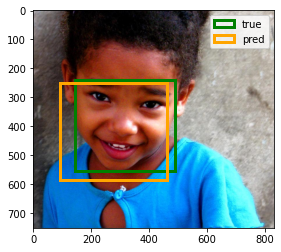

92it [28:39, 19.52s/it]


IoU: 0.74


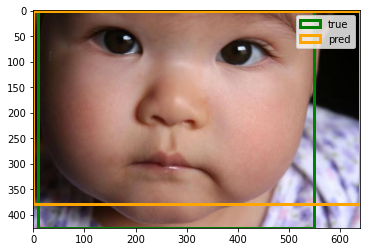

93it [28:45, 15.67s/it]


IoU: 0.74


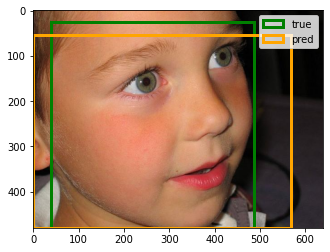

94it [28:52, 13.04s/it]


IoU: 0.78


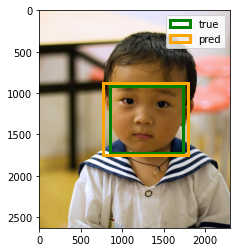

95it [29:39, 23.09s/it]


IoU: 0.72


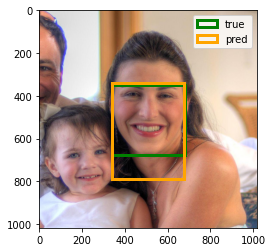

96it [29:51, 19.92s/it]


IoU: 0.67


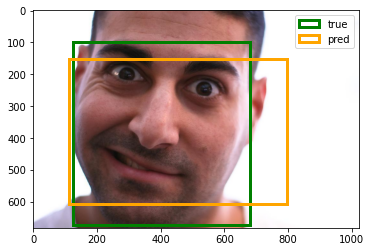

97it [30:01, 16.91s/it]


IoU: 0.54


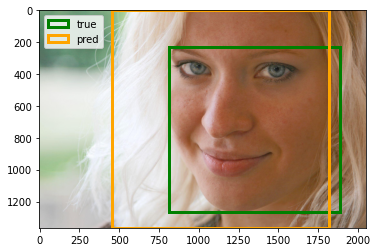

98it [30:26, 19.20s/it]


IoU: 0.54


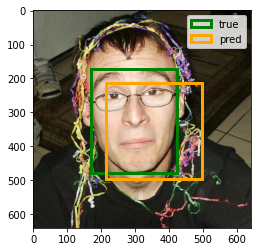

99it [30:34, 15.83s/it]


IoU: 0.13


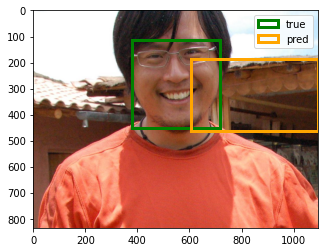

100it [30:45, 18.46s/it]


In [ ]:
clf_model.eval()

iou_metrics = []
for img, true_bbox in tqdm(zip(images_val, bboxes_val)):

    height = img.shape[0]
    width = img.shape[1]

    candidate_bbox_images = []
    candidate_bboxes = []
    best_bboxes = []

    for left in np.linspace(0, width, num=10, dtype=int):
        for right in np.linspace(0, width, num=10, dtype=int):
            for top in np.linspace(0, height, num=10, dtype=int):
                for bottom in np.linspace(0, height, num=10, dtype=int):

                    current_bbox = Bbox(left=left, right=right, top=top, bottom=bottom)
                    if current_bbox.area() < 0.001 or left >= right or top >= bottom:
                        continue
                    
                    bbox_image = crop_bbox(img, current_bbox)
                    candidate_bbox_images.append(transform_image(bbox_image))
                    candidate_bboxes.append(current_bbox)

                    if len(candidate_bbox_images) >= 100:
                        with torch.no_grad():
                            X = FloatTensor(torch.stack(candidate_bbox_images)).to(device)
                            predictions = clf_model(X)

                            pred_values = predictions.cpu().numpy()

                        pred_labels = np.argmax(pred_values, axis=1)

                        for i, label in enumerate(pred_labels):
                            if label == 1:
                                best_bboxes.append((pred_values[i][label], candidate_bboxes[i]))

                        best_bboxes.sort(reverse=True)
                        best_bboxes = best_bboxes[:10]

                        candidate_bbox_images = []
                        candidate_bboxes = []

    pred_bbox = NMS(best_bboxes)[0]

    iou_value = IoU(pred_bbox, true_bbox)
    iou_metrics.append(iou_value)
    print('\nIoU:', round(iou_value, 2))

    draw_bboxes(img, true_bbox, pred_bbox)


In [ ]:
print('Average IoU:', round(np.mean(iou_metrics), 2))

Average IoU: 0.59
